In [272]:
#import all relevant modules/libraries
import seaborn as sns
import math
import networkx as nx
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import pprint
import csv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import ast
import pandas as pd
from fa2 import ForceAtlas2
from community import community_louvain
from IPython.display import HTML

In [273]:
client_id = "b06999e849764d0cb9d85ff2b4762fd9"
client_secret = "4565b9044d694deb9cf54eddb9b08e69"

client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Basic stats (topsters_all.csv)

## Data cleaning/Pre-processing

To gather the data for the topsters_all.csv, **we were based on the artists.csv**, from which we retrieved every artist. Having ecery artist, leaves with one thing. That is to get the **top 10 songs** of each one.

#### The first issue that we encountered was that the artists.csv contains a number duplicate artists.<br>
> ***Why this happens is explained below:<br>***
To obtain the aritsts.csv we downloaded each genre's 100 most popular artists. However, there are artists associated with more than one genres, thus they appear more than once in the artists.csv<br><br>
>**In the topsters_all.csv we want every song to occur only once, but we also need to keep all the different genres that this song is associated with.**<br><br>
>To do this we make a list of all the genres that the artist of the respective song is associated with, and assign this list as the song's genre. 
(Unfortunately the Spotify API does not directly return the genre(s) of a particualar song, that is why we assign the corresponding artist's genre(s).

#### The second issue was that we still encountered duplicate songs.<br>
> ***Why this happens is explained below:***<br>
Since two artists might have collaborated on a very popular song, this song will appear on both artist's top 10 list.<br><br>
> This was solved by creating a list where in every iteration we test if every new song is already in the list. If not we append it and write the song in csv. If it is already in the list we skip it. We keep doing that until we have finished with all songs.<br><br>
> Yes. Since the genre we assign to each song, is the genre of it's artist, if a popular song "belongs" to two artists and we skip one of them, it is possible that we miss a genre. However, we assume that the two collaborating artists, most likely belong to the same genre(s), and there is no important "loss" of data.

#### ***Below is the code for obtaining the topsters_all.csv***

In [7]:
# Read the artists.csv, on which we will be based to create the topsters_all.csv
artists_df = pd.read_csv(r"C:\Users\admin\Desktop\Digital Media Eng - DTU\1st Semester\Social Graphs and Interactions\Final Project\SGI_Spotify_Project-master\artists.csv")

In [8]:
# Here is the list of genres that we will focus on for this project
genres = ['pop','rock','hip-hop','blues','indie','country','soul']

In [785]:
# Create the topsters_all1.csv
path = "C:/Users/admin/Desktop/Digital Media Eng - DTU/1st Semester/Social Graphs and Interactions/Final Project/SGI_Spotify_Project-master/topsters_all1.csv"
songs = [] # create a list, where every song will be appended at a time

with open(path, "wb") as f:
    top_tracks_csv = csv.writer(f)
    top_tracks_csv.writerow(['Genre', 'Artist', 'Artist_id', 'Song', 'Song_id', 'Audio_Metric'])
    
    for index, row in artists_df.iterrows():
        artist_id = row['Artist_id']
        artist_name = row['Artist']
        genre = list(artists_df.loc[artists_df['Artist_id'] == artist_id]["Genre"]) # geta list of every artist's genre(s)
        top_tracks_list = sp.artist_top_tracks(artist_id)['tracks'] # get top 10 tracks of every artist by the Spotify API
        for song in top_tracks_list:
            try:
                song_id = song['id']
                if song_id not in songs:# check if the song is already written in the csv.
                    songs.append(song_id)
                    audio_features = sp.audio_features([song_id])[0]
                    #in the three following lines I round the song features into two decimals.
                    valence = round(audio_features['valence'],2)
                    energy = round(audio_features['energy'],2)
                    danceability = round(audio_features['danceability'],2)
                    audio_metric = [valence, energy, danceability] # create the audio_metric vector
                    row = [genre, artist_name.encode('ascii', 'ignore'), str(artist_id).encode('ascii', 'ignore'), song['name'].encode('ascii', 'ignore'), str(song['id']).encode('ascii', 'ignore'), audio_metric]
                    top_tracks_csv.writerow(row)
            except:
                pass

In [9]:
# read the topsters_all.csv, to create the songs_df and use it later on, in the Network creation and analysis
songs_df = pd.read_csv(r"C:\Users\admin\Desktop\Digital Media Eng - DTU\1st Semester\Social Graphs and Interactions\Final Project\SGI_Spotify_Project-master\topsters_all.csv")

## Dataset stats

### The topsters_all.csv is created!<br>
>It is a 600KB file that contains 5.549 lines and 6 rows.<br>
As we already discussed, each line represents a song and various information about it.<br><br>
>One could argue that we should have 7.000 songs, since we download the top 10 songs of top 100 artists of each one of 7 genres.<br>
However, as we said already there were a lot of duplicate songs, which we eliminated from the our final file.

### This file, among others, contains an audio metric for each song.
>#### ***The audio metric is a vector that includes the 3 following musical attributes:***<br>
***Valence***:<br> A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).<br><br>
***Energy***:<br>
Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale.<br><br>
***Danceability***:<br>
Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.<br>
>#### ***The 3 aformentioned attributes will be used to assess the musical similarity between songs.***

### But there has been one concern...
#### How are we going to compare the songs using this audio metric? 
***At first we had one idea:***

- #### Get the mean of the three elements, in order to obtain one number out of the vector.
> This is a handy and faster solution, as you need to compare just one number for each song, in order to decide if it will be connected with another one.<br><br>
>However, we must consider that what we are measuring here is song similarity and ***each element of this vector describes a unique quality of every song.***
***Diminishing this three-dimentional vector to just the mean of it's elements***, most probably ***comes with a cost***. That is, that there may be several different vectors (different song qualities), that produce the same mean, and this could lead to connecting two songs that are completely different.<br><br>
We said before that the three elements of the vector are valence, energy and danceability. It is reasonable to assume that a song with high danceability, most likely has high valence and energy. Or that a song with low valence, most likely has also low danceability and energy. If this is true, it means that these three elements follow a specific pattern and thus we can use the mean of every vector without getting a false idea for how a song sounds.<br><br><br>
**To find out if this is actually true, we have put it to the test:**<br><br>
>As you will see below, what we did was find the distribution of the absolute subtraction between two elements, for each pair of elements. If all songs have a very small difference between their elements' values, then we can safely use the mean.

In [10]:
#in the following dictionary each key is a string that describes the distance of the respective musical attributes.
#the value of each key is a list of floats, which stand for the actual distance for each song.The
elements_distance = {"valence-energy":[],"valence-danceability":[],"danceability-energy":[]}
for index, row in songs_df.iterrows():
    audio_metric = ast.literal_eval(row["Audio_Metric"])
    valence = round(audio_metric[0],2)
    energy = round(audio_metric[1],2)
    danceability = round(audio_metric[2],2)
    elements_distance["valence-energy"].append(round(abs(valence-energy),2))
    elements_distance["valence-danceability"].append(round(abs(valence-danceability),2))
    elements_distance["danceability-energy"].append(round(abs(danceability-energy),2))

In [11]:
def elements_distance_distribution(mode):
    points = elements_distance[mode]
    (n, binvector, patches) = plt.hist(points, bins=3)
    n = list(n)
    binvector = list(binvector)
    plt.title("Distribution of absolute subtraction between "+mode)
    plt.show()
    print "The figure above shows that there are:\n"
    print str(int(n[0]))+" songs with "+mode+" distance between "+str(round(binvector[0],2))+" and "+str(round(binvector[1],2))
    print str(int(n[1]))+" songs with "+mode+" distance between "+str(round(binvector[1],2))+" and "+str(round(binvector[2],2))
    print "and "+str(int(n[2]))+" songs with "+mode+" distance between "+str(round(binvector[2],2))+" and "+str(round(binvector[3],2))

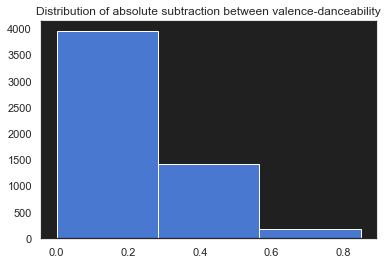

The figure above shows that there are:

3956 songs with valence-danceability distance between 0.0 and 0.28
1418 songs with valence-danceability distance between 0.28 and 0.57
and 174 songs with valence-danceability distance between 0.57 and 0.85


In [217]:
elements_distance_distribution("valence-danceability")

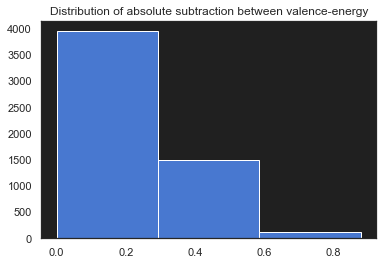

The figure above shows that there are:

3950 songs with valence-energy distance between 0.0 and 0.29
1485 songs with valence-energy distance between 0.29 and 0.59
and 113 songs with valence-energy distance between 0.59 and 0.88


In [218]:
elements_distance_distribution("valence-energy")

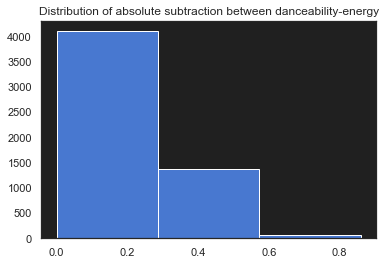

The figure above shows that there are:

4102 songs with danceability-energy distance between 0.0 and 0.29
1372 songs with danceability-energy distance between 0.29 and 0.57
and 74 songs with danceability-energy distance between 0.57 and 0.86


In [219]:
elements_distance_distribution("danceability-energy")

As we see above, the pattern that we have talked about earlier really exists in very high amount of songs, for every pair of elements. However, there are quite a few songs with high "distance" between their elements and this cannot go unnoticed.<br><br>
Since it is always better to use examples, below you can hear a song with very **low valence**, but **high danceability** sounds like.
> This song has valence = 0.12 and danceabilty = 0.73. We remind you that the max value for these elements is 1. Keep reading and enjoy!

In [15]:

# Youtube
HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/q7lKpkW_jG8?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')

***So, after actually listening to songs with high distance between their elements, we came up with a second idea, regarding how we are goint to use our vector. And that is the idea we kept :***

- #### We calculate the Euclidean distance between the vectors.
>This way we use the whole vector and essentially create a sphere in space, which contains all the vectors with distance equal, or lower to the one that we choose to use as a treshold.<br><br>
***if:***<br><br>
$ \sqrt{(valence_2 - valence_1)^2 + (energy_2 - energy_1)^2 + (danceability_2 - danceability_1)^2} <= treshold $, <br><br>
***then add_edge between 1 and 2***

In the next chapter you will see the graph created, following the idea described above.

# Tools, theory and analysis

## Functions

### Network Analysis functions

Below are all the functions used for calculating particular attributes and manipuating the Network. Read the comments for further information.

In [16]:
# Returns a list of nodes, that will be used for creating a Network's subgraph based on different genres.
def nodes_of(genre):
    nodes = []
    for node in H.nodes:
        if genre in H.nodes[node]["Genre"]:
            nodes.append(node)
    return nodes


# Returns a subgraph of the full Network, based on the genre.
def subgraph_of(genre):
    nodes = nodes_of(genre) # here the function described below is used.
    g = H.subgraph(nodes)
    return g


# Retuns all the connected components of a graph, providing that they contain 10 nodes and above.
def components_of(genre):
    x=[len(c) for c in nx.connected_component_subgraphs(subgraph_of(genre)) if len(c)>10]
    print "In "+str(genre)+" there are "+str(len(x))+" components as follows: "+str(x)
    plt.hist(x)


# Returns a graph, which the giant component of a genre.
def giant_of(genre):
    giant = max(nx.connected_component_subgraphs(subgraph_of(genre)), key=len)
    return giant
    

# Returns a string per top song, which shows name of song, artist, degree and the song's audio metric
# example: Gold On The Ceiling by The Black Keys   Degree: 231    Audio Metric: [0.56, 0.83, 0.51]
def printTopMembers(G):
    values = nx.degree(G)
    values_res_sort = sorted(values, key=lambda kv: kv[1], reverse=True) #Sort the nodes according to he values calculated
    cnt = 0
    print "The Top 5 most connected songs are:\n"
    for node in values_res_sort:
        if cnt ==5:
            break
        # In the line below we use the songs_df to find the corresponding artist of the song in question.
        artist = list(songs_df.loc[songs_df['Song'] == G.nodes[node[0]]["Name"], 'Artist'])[0]
        print G.nodes[node[0]]["Name"]+" by "+artist+"\t Degree: "+str(node[1])+"\t Audio Metric: "+ str(G.nodes[node[0]]["Audio_Metric"])
        print "\n"
        cnt += 1 

### Degree Distribution Functions

In [214]:
#Plot the Degree Distribution of a Network
def plot_distribution(data_points):

    #create the bin factor
    binvector = []
    bins = 10
    x = min(data_points)
    y = max(data_points)
    z = (y-x)/float(bins)
    bin_factor = round(z,2)

    #create the binvector
    cnt = x
    for i in range(bins+1):
        binvector.append(round(cnt,2))
        cnt += bin_factor

    #set preferences
    sns.set(style="white", palette="muted", color_codes=True)

    #Change figure dimensions
    a4_dims = (12,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    ax.set(xlabel='Degrees', ylabel='Number of songs percentage')

    #Plot Histogram
    sns.distplot(np.array(data_points), bins = binvector, ax=ax, color="g", label = "Degree Distribution")
    #print "\nBinvector: "+str(list(binvector))
    
    plt.legend()
    plt.show()

### Communities Functions

In [18]:
# Returns the communities of a Network
def computeCommunities(G):
    #first compute the best partition
    partition = community_louvain.best_partition(G)
    return partition



# Returns a dict with number of partitions as keys
def mood_dict_of(G):
    partition = computeCommunities(G) # finds the Network's communities.
    mood_dict = {} # initialize the dict to be returned.
    valence = []
    energy = []
    danceability = []
    for party in range(max(partition.values())+1): # set loop iterations equal to the number of communities of the network.
        for song in partition.keys(): # iterate through song id's
            if partition[song] == party: # filters only the songs that belong to the given loop's 
                # 3 lines below: append attribute of every song to the corresponding list.
                valence.append(G.node[song]['Audio_Metric'][0]) 
                energy.append(G.node[song]['Audio_Metric'][1])
                danceability.append(G.node[song]['Audio_Metric'][2])
                try:
                    # 4 lines below: assign values to the dictionary's keys.
                    mood_dict[party]["id"].append(song)
                    mood_dict[party]["Name"].append(G.node[song]['Name'])
                    mood_dict[party]["Genre"].append(G.node[song]['Genre'])
                    mood_dict[party]["Audio_Metric"].append(G.node[song]['Audio_Metric'])
                except:
                    # 1 line below: populate dictionary's for the first time.
                    mood_dict[party] = {"id":[song], "Name":[G.node[song]['Name']], "Genre":[G.node[song]['Genre']], "Audio_Metric":[G.node[song]['Audio_Metric']]}
        # populate the dictionary with another dict, which has "Party_metric" as key, 
        # and another dictionary as value, with the 3 song qualities as keys and their mean of all the song's of the partition as values.
        mood_dict[party]["Party_metric"] = {"valence": round((min(valence)+max(valence))/2, 2), "energy":round((min(energy)+max(energy))/2, 2), "danceability":round((min(danceability)+max(danceability))/2, 2)} 
        #3 lines below: re-initiate the lists, for population with attributes of songs, which belong to the next community.
        valence = []
        energy = []
        danceability = []
    return mood_dict



# Returns the number of communities per network, plus the number of songs and mean audio_metric per community.
def partitions_data(G):
    print "There are "+str(len(mood_dict_of(G)))+" main communities in the network."
    print "Each one contains the following amount of songs: \n"
    for i in range(len(mood_dict_of(G))):
        print str(len(mood_dict_of(G)[i]['id']))

    data = []
    for key in mood_dict_of(G).keys():
        valence = mood_dict_of(G)[key]["Party_metric"]["valence"]
        energy = mood_dict_of(G)[key]["Party_metric"]["energy"]
        danceability = mood_dict_of(G)[key]["Party_metric"]["danceability"]
        data.append([valence,energy,danceability])
    print "\nThe mean Audio_Metric for each community is: \n"+str(data)

### Functions for visualizing the Networks.

In [36]:
#Set the parameters for the Force Atlas Algorithm. These parameters are set only for the visualization of the full graph.
def setForceAtlasParameters():
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=True,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=0.1,

                              # Performance
                              jitterTolerance=250.0,  # Tolerance
                              barnesHutOptimize=False,
                              barnesHutTheta=2.0,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=15000.0,
                              strongGravityMode=False,
                              gravity=5.0,

                              # Log
                              verbose=False)
    return forceatlas2



# The parameters below are set for the sub_graphs of each genre.
def setForceAtlasParameters2():
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=True,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=0.1,

                              # Performance
                              jitterTolerance=250.0,  # Tolerance
                              barnesHutOptimize=False,
                              barnesHutTheta=2.0,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=100.0,
                              strongGravityMode=False,
                              gravity=80.0,

                              # Log
                              verbose=False)
    return forceatlas2

In [263]:
#Calculate node sizes according to the given mode
def calculateSizeOfNodes(mode, G, nodes):
    if (mode == "degrees"):
        #Set nodes' size according to their degree
        deg = nx.degree(G)
        sizes = [deg[node]*3 for node in nodes]
    if (mode == "betweenness_centrality"):
        #Set nodes' size proportional to their betweenness centrality
        between_res = nx.betweenness_centrality(G)
        sizes = [between_res[node]*20000 for node in nodes]
    if (mode == "eigenvector_centrality"):
        #Set nodes' size proportional to their eigenvector centrality
        eigen_res = nx.eigenvector_centrality_numpy(G)
        sizes = [eigen_res[node]*10000 for node in nodes]
    return sizes

In [38]:
#Calculate node colors according to the given mode
def calculateColorsOfSongs(mode,G,nodes):
    colors = []
    # distinguish color calculation, depending on wherher we visualize the full graph, or a sub_graph for a genre.
    if(mode == "full_graph"):
        #Set node colors according to their genre
        for n in nodes:
            if len(G.node[n]['Genre']) == 1:
                if ('pop' in G.node[n]['Genre']):
                    pop_patch = mpatches.Patch(color='#4abdac', label='Pop Nodes', facecolor = 'white')
                    colors.append("#4abdac")#fresh green
                elif('rock' in G.node[n]['Genre']):
                    rock_patch = mpatches.Patch(color='#fc4a1a', label='Rock Nodes')
                    colors.append("#fc4a1a")#vermillion red
                elif('hip-hop' in G.node[n]['Genre']):
                    hip_hop_patch = mpatches.Patch(color='#f7b733', label='Hip Hop Nodes')
                    colors.append("#f7b733")#sunshine
                elif( 'blues' in G.node[n]['Genre']):
                    blues_patch = mpatches.Patch(color='#0375b4', label='Blues Nodes')
                    colors.append("#0375b4")#starry night blue
                elif( 'indie' in G.node[n]['Genre']):
                    indie_patch = mpatches.Patch(color='#007849', label='Indie Nodes')
                    colors.append("#007849")#irises green
                elif('country' in G.node[n]['Genre']):
                    country_patch = mpatches.Patch(color='#e37222', label='Country Nodes')
                    colors.append("#e37222")#country tangerine
                elif('soul' in G.node[n]['Genre']):
                    soul_patch = mpatches.Patch(color='#07889b', label='Soul Nodes')
                    colors.append("#07889b")#teal blue
            else:
                mixt_patch = mpatches.Patch(color='#FFFFFF', label='Mixt Nodes')
                colors.append("#FFFFFF")#teal blue 
        leg = plt.legend(handles=[pop_patch, rock_patch, hip_hop_patch, blues_patch, indie_patch, country_patch, soul_patch, mixt_patch], fontsize = 15)
        for text in leg.get_texts():
            plt.setp(text, color = 'w')
            
    elif(mode=="solo_graph"):
        for n in nodes:
            if len(G.node[n]['Genre']) == 1:
                if ('pop' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#4abdac', label='Pop Nodes', facecolor = 'white')
                    colors.append("#4abdac")#fresh green
                elif('rock' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#fc4a1a', label='Rock Nodes')
                    colors.append("#fc4a1a")#vermillion red
                elif('hip-hop' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#f7b733', label='Hip Hop Nodes')
                    colors.append("#f7b733")#sunshine
                elif( 'blues' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#0375b4', label='Blues Nodes')
                    colors.append("#0375b4")#starry night blue
                elif( 'indie' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#007849', label='Indie Nodes')
                    colors.append("#007849")#irises green
                elif('country' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#e37222', label='Country Nodes')
                    colors.append("#e37222")#country tangerine
                elif('soul' in G.node[n]['Genre']):
                    solo_patch = mpatches.Patch(color='#07889b', label='Soul Nodes')
                    colors.append("#07889b")#teal blue
            else:
                mixt_patch = mpatches.Patch(color='#FFFFFF', label='Mixt Nodes')
                colors.append("#FFFFFF")#teal blue 
        leg = plt.legend(handles=[solo_patch, mixt_patch], fontsize = 15)
        for text in leg.get_texts():
            plt.setp(text, color = 'w')
    return colors

In [245]:
#Visualize network 
def drawNetworkofSongs(mode, mode1, G, positions,title):
    #Define figure size
    plt.figure(3,figsize=(17,12))
    #Set backgroud color
    plt.rcParams['axes.facecolor'] = "#202020"
    plt.title(title, fontsize=40)
    
    #Hide grid lines
    plt.grid(False)
    # Hide axes ticks
    plt.xticks([])
    plt.yticks([])
        
    plt.rcParams['font.family'] = 'Verdana'
    
    #Obtain list of nodes of the graph
    nodes = nx.nodes(G)
    
    #Calculate node sizes according to the given mode
    sizes = calculateSizeOfNodes(mode,G,nodes)
    #Calculate node colors according to the given mode
    colors = calculateColorsOfSongs(mode1,G,nodes)
    #colors = calculateColorsOfNodes(mode,G_und,nodes)

    #Plot created network
    nx.draw_networkx(G, positions, nodelist=nodes, cmap=plt.get_cmap('jet'), width=0.4, with_labels=False, node_size=sizes, node_color=colors, edge_color="#a0a0a0")
    plt.show()
    

#Visualize the network of communities
def drawNetworkCommunities(G, positions, partition,title):
    #Define figure size
    plt.figure(3,figsize=(17,12))
    plt.title(title, fontsize=40)
    #Set backgroud color
    plt.rcParams['axes.facecolor'] = "#FFFFFF"
    
    #Hide grid lines
    plt.grid(False)
    # Hide axes ticks
    plt.xticks([])
    plt.yticks([])
    
    plt.rcParams['font.family'] = 'Verdana'
    
    #Obtain list of nodes of the graph
    nodes = partition.keys()
    edges = G.edges
    
    #Calculate node colors according to community assigned
    colors= list(partition.values())
    #Plot created network
    nx.draw_networkx(G, positions, nodelist=nodes, edgelist=edges,cmap=plt.get_cmap('gist_ncar'), width=0.4, with_labels=False, node_size=50, node_color=colors, edge_color='grey')
    plt.show()

In [39]:
#Calculate the nodes coordinates using the Force Atlas Algorithm
def calculateCoordinatesUsingForceAtlas(G, forceatlas2):
    positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=3000)
    return positions

## Analysis Step 1 - Create the main Network

>Firstly, let's explain what exactly the **Network of Similarity** is about:
- Nodes: Unique Songs
- Edges: An edge connects two songs, only if their vector distance is equal, or lower to the chosen treshold. Or, in other words two songs are connected, only if they are similar enough for our chosen standards.

>The main idea of what we want to do is described below:
- Find the songs that represent the "sound" of each genre. ***(Top 5 songs based on connectivity)***
- Find how consistent each genre is soundwise. Do most songs sound similar, or you can find many different sounds/styles? ***(See how many different connected components there are per genre. Degree distribution for each genre)***
- Find the main different sounds of each genre ***(by creating communities)***

>We use the **NetworkX package** for the creation of the Network and the functions, which we will use for further analysis.<br> 
Below we create the main Network of Song Similarity, that is the network of all songs, of all genres.

In [83]:
# Create graph nodes and give them attributes
H = nx.Graph()
for index, row in songs_df.iterrows():
    song_id = row['Song_id']
    song_name = row['Song']
    genre = row['Genre']
    audio_metric = row['Audio_Metric']
    H.add_node(song_id)
    nx.set_node_attributes(H, {song_id: {"Name": song_name, "Genre": ast.literal_eval(genre), "Audio_Metric": ast.literal_eval(audio_metric) }}) 

In [84]:
# Create graph's edges
for node in H.nodes:
    metric = H.node[node]['Audio_Metric']
    for node2 in H.nodes:
        if node2 == node:
            continue
        if H.has_edge(node,node2) == True:
            continue
        metric2 = H.node[node2]['Audio_Metric']
        #below the euclidian distance calculation takes place.
        if math.sqrt((abs(metric[0]-metric2[0]))**2 + (abs(metric[1]-metric2[1]))**2 + (abs(metric[2]-metric2[2]))**2) <=0.1:
            H.add_edge(node,node2)

In [85]:
print "The graph has "+str(len(H.nodes))+" nodes/songs!"
print "The graph has "+str(len(H.edges))+" edges!"
print "The graph has "+str(len(list(nx.isolates(H))))+" isolated nodes/songs."

The graph has 5548 nodes/songs!
The graph has 230531 edges!
The graph has 13 isolated nodes/songs.


## Create a SubGraph of the main graph

The original graph is way too big to be visualized, so we create a smaller one with the 1.000 most connected nodes. It is also worth mentioning that this is a complete graph, as there are 0 isolated nodes.

In [221]:
# Create a sorted list of the 1000 most connected nodes of the original graph.
node_degrees = nx.degree(H)
sorted_node_degrees = sorted(node_degrees, key=lambda kv: kv[1], reverse=True)
subgraph_node_degrees = sorted_node_degrees[:1000]
subgraph_nodes = []
for node in subgraph_node_degrees:
    subgraph_nodes.append(node[0])

In [224]:
# Use the list created above to create subgraph of H.
sub_H = H.subgraph(subgraph_nodes)

In [225]:
print "The Sub_Graph has:"
print str(len(sub_H.nodes))+" nodes!"
print str(len(sub_H.edges))+" edges!"
print str(len(list(nx.isolates(sub_H))))+" isolates."

The Sub_Graph has:
1000 nodes!
61485 edges!
0 isolates.


As we can see now the number of nodes and edges of the subgraph are now propet for a Network visualization.

### Calculate node positions by using the ForceAtlas tool
We do this two times because we are going to visualize a really big graph (the one of all songs, of all genres) and several smaller ones (the ones with songs per genre)

In [43]:
forceatlas = setForceAtlasParameters()
forceatlas2 = setForceAtlasParameters2()
positions = calculateCoordinatesUsingForceAtlas(H,forceatlas)
positions2 = calculateCoordinatesUsingForceAtlas(H,forceatlas2)

## Analysis Step 2 - Analyze the Network per Genre

### Pop Network

### Visualization of Pop Network

Firstly we visualize the Network using the ***drawNetworkofSongs***, which also uses the other functions described under the _Visualization Fucntions_ segment.

In [133]:
#components_of("pop")

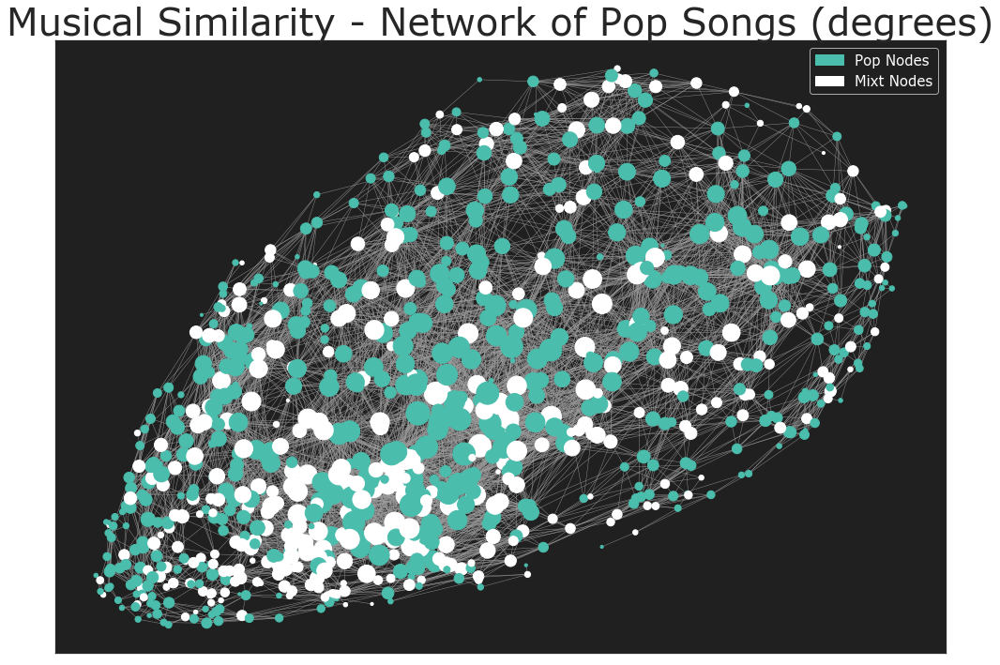

In [246]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("pop"), positions2, 'Musical Similarity - Network of Pop Songs (degrees)')

### Degree Distribution of Pop Songs subgraph

Below you can see the degree distribution of the Pop Network of Musical Similarity.

What we see here is a Netwrok with most nodes being low-connected, while a only a few nodes are the most connected ones.

By this kind of degree distribution we can infer that only a few amount of the total of pop songs, represent the "mood" of the genre!


Binvector: [1.0, 7.3, 13.6, 19.9, 26.2, 32.5, 38.8, 45.1, 51.4, 57.7, 64.0]


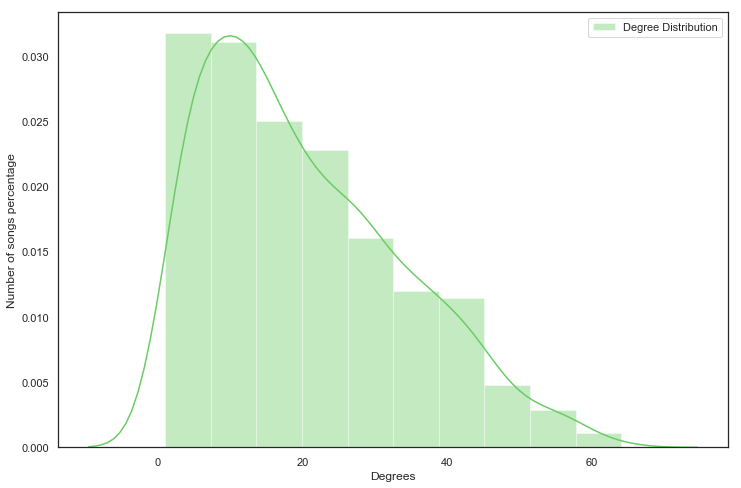

In [211]:
plot_distribution(dict(nx.degree(giant_of("pop"))).values())

### Top 5 most connected songs of Pop

Below we print the top 5 songs of Pop (degree-wise), their respective artist and also their audio metric.

By examining the audio metric, we also see that all top-5songs are very similar to each other in terms of mood. This inidicates a sense of consistency regarding the sound of this song and, most likely - regarding the previous findings (degree distribution) - of the whole genre. (which makes sense, if we sit back and think a little about how non-diverse pop music is.)

- **Valence** audio metric ranges from 0.41 - 0.43
- **Energy** audio metric ranges from 0.57 - 0.66
- **Danceability** metric ranges from 0.69 - 0.72

By the above we can see that Pop's main mood and sound has average "happyness", average energy, and relatively high danceability.

In [92]:
printTopMembers(giant_of("pop"))

The Top 5 most connected songs are:

Love on the Weekend by John Mayer	 Degree: 64	 Audio Metric: [0.42, 0.58, 0.72]


thank u, next by Ariana Grande	 Degree: 62	 Audio Metric: [0.43, 0.65, 0.72]


Sober by G-Eazy	 Degree: 60	 Audio Metric: [0.43, 0.6, 0.7]


TAlk tO Me (with Rich The Kid feat. Lil Wayne) - Remix by Rich The Kid	 Degree: 59	 Audio Metric: [0.45, 0.66, 0.7]


bellyache by Billie Eilish	 Degree: 58	 Audio Metric: [0.41, 0.57, 0.69]




### Community Detection

Community detection in Pop and every genre below is realized, by implementing the **Louvain algorithm**. 

You can review the code and explanation of our functions under the Community Functions semgment.

#### Visualization of Communities Network of Pop

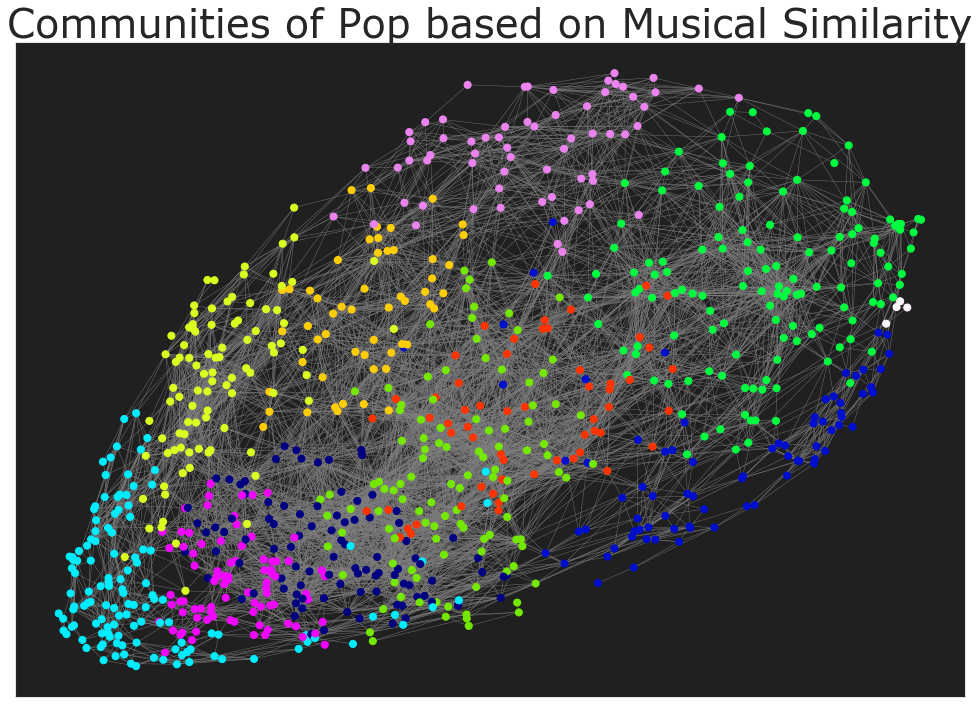

In [247]:
partition = computeCommunities(giant_of("pop"))
drawNetworkCommunities(giant_of("pop"), positions2, partition, 'Communities of Pop based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Pop from saddest/non-danceable to the happiest/most danceable/energetic.

In [150]:
partitions_data(giant_of("pop"))

There are 11 main communities in the network.
Each one contains the following amount of songs: 

96
77
126
135
109
93
54
58
84
64
4

The mean Audio_Metric for each community is: 
[[0.39, 0.54, 0.78], [0.73, 0.48, 0.7], [0.34, 0.41, 0.48], [0.74, 0.78, 0.68], [0.52, 0.53, 0.69], [0.27, 0.69, 0.54], [0.33, 0.79, 0.7], [0.49, 0.72, 0.81], [0.23, 0.48, 0.84], [0.54, 0.84, 0.56], [0.94, 0.81, 0.9]]


# Rock Network

### Visualization of Rock Network

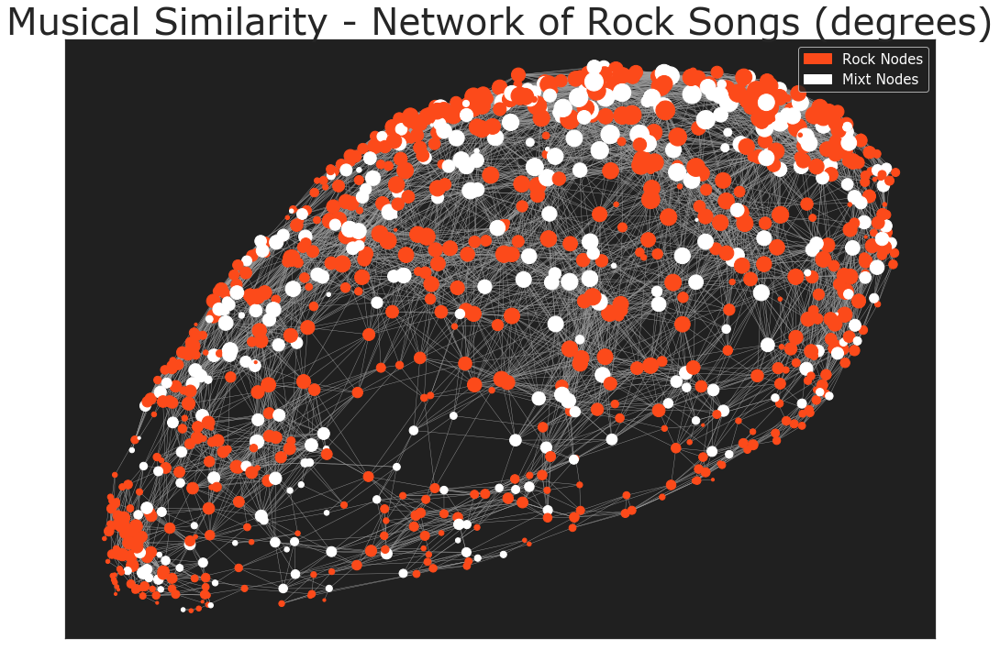

In [248]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("rock"), positions2, 'Musical Similarity - Network of Rock Songs (degrees)')

### Degree Distribution of the subgraph of Rock Songs

Below you can see the degree distribution of the Rock Network of Musical Similarity.

Compared to the Pop network, this degree-distribution is closer to the gaussian distributioin, but still there is a tendency of most nodes being more low-connected. So, we have almost the same phenomenon, of few songs representing rock's main "sound" or style, but in a lesser extent, compared with Pop.

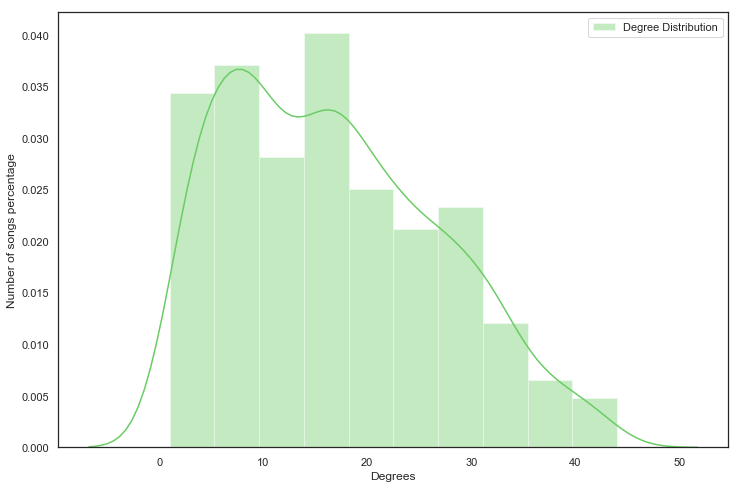

In [268]:
plot_distribution(dict(nx.degree(giant_of("rock"))).values())

### Top 5 Songs most connected songs of Rock Network

We see again is that all the top-5 songs are really close regarding the musical attributes we have extracted from Spotify. What we see, thhough, is that regardless of the fact that these songs share almost the same musical attribute, their sound is not very close. (e.g. Master of Puppets by Metallica, and Into the Night by Santana).

#### Why this happens?
> The musical attributes we have chosen can detect the general "mood" of the song, how upbeat it is, or how slow and sad. What they cannot detect well is the actual sound, meaning the instruments used, which is very difficult to calculate.
Spotify is not very "strict" with how it separates songs, based on genres and as we can see this happens in the case of Rock.<br><br>
So, this metric of ours, works even better and more reliably, when dealing with wee-defined and consistent genres.

- **Valence** audio metric ranges from 0.56 - 0.62
- **Energy** audio metric ranges from 0.83 - 0.87
- **Danceability** metric ranges from 0.54 - 0.59

By the above we can see that Rock's main mood and sound has average "happyness", very high energy, and relatively high danceability.

In [98]:
printTopMembers(giant_of("rock"))

The Top 5 most connected songs are:

Master of Puppets (Remastered) by Metallica	 Degree: 44	 Audio Metric: [0.56, 0.83, 0.54]


The Last Of The Real Ones by Fall Out Boy	 Degree: 43	 Audio Metric: [0.56, 0.87, 0.58]


Shut Up and Dance by WALK THE MOON	 Degree: 43	 Audio Metric: [0.62, 0.87, 0.58]


Into the Night (feat. Chad Kroeger) by Santana	 Degree: 43	 Audio Metric: [0.6, 0.84, 0.59]


Hash Pipe by Weezer	 Degree: 43	 Audio Metric: [0.62, 0.88, 0.58]




### Visualization of Communities Network of Rock

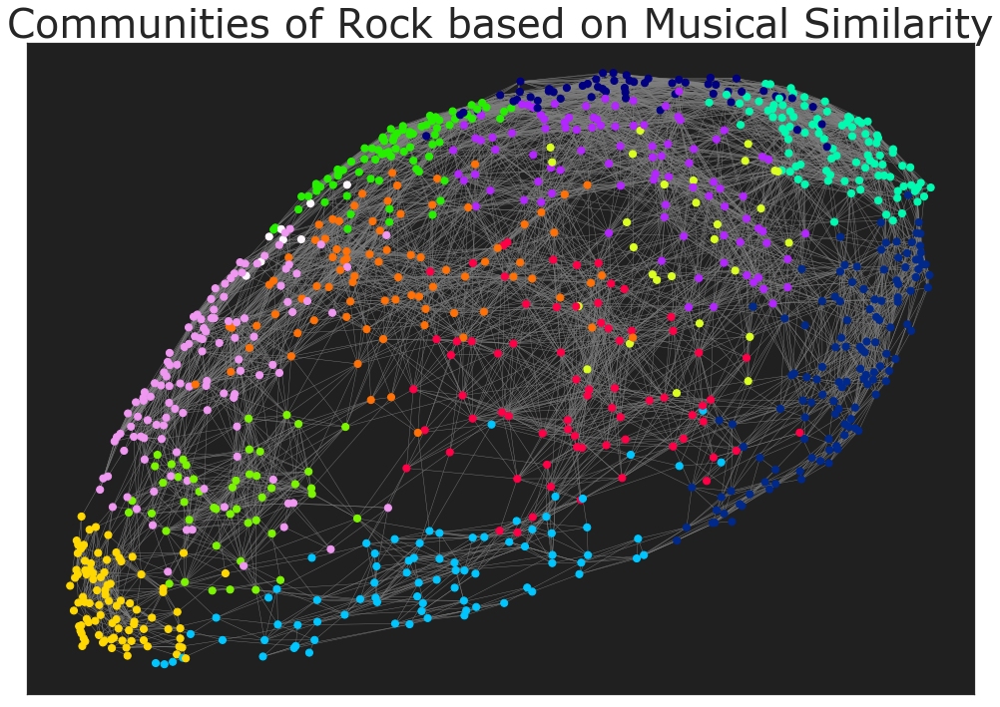

In [249]:
partition = computeCommunities(giant_of("rock"))
drawNetworkCommunities(giant_of("rock"), positions2, partition, 'Communities of Rock based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Rock from saddest/non-danceable to the happiest/most danceable/energetic.

In [100]:
partitions_data(giant_of("rock"))

There are 13 main communities in the network.
Each one contains the following amount of songs: 

56
124
80
95
78
47
28
89
82
71
92
117
8

The mean Audio_Metric for each community is: 
[[0.7, 0.91, 0.38], [0.82, 0.66, 0.68], [0.56, 0.34, 0.6], [0.81, 0.87, 0.58], [0.33, 0.86, 0.45], [0.38, 0.45, 0.4], [0.7, 0.68, 0.42], [0.24, 0.29, 0.45], [0.47, 0.67, 0.42], [0.6, 0.69, 0.7], [0.6, 0.81, 0.55], [0.24, 0.7, 0.49], [0.27, 0.81, 0.27]]


# Hip-Hop Network

### Visualization of Hip-Hop Network

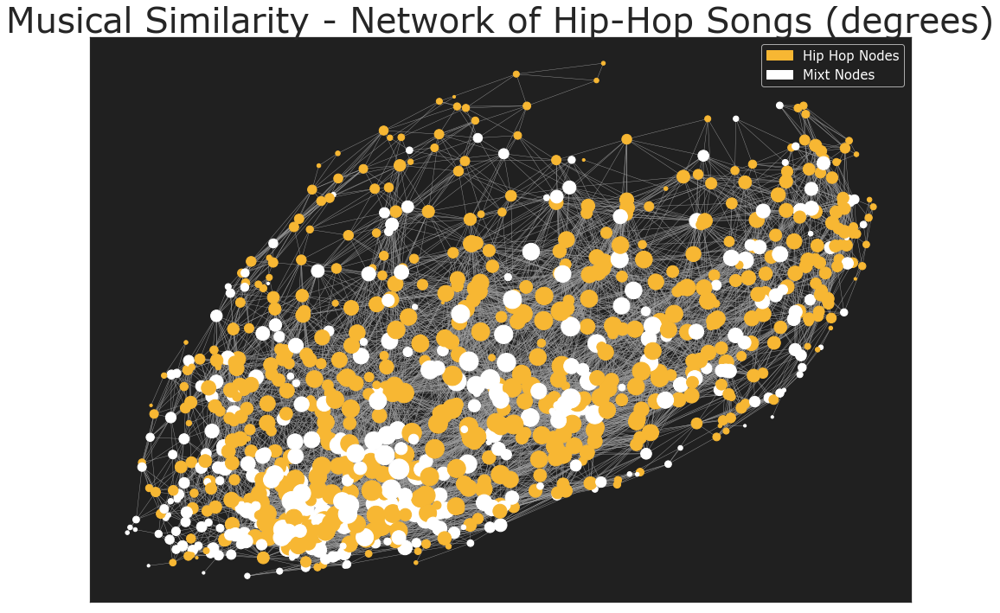

In [250]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("hip-hop"), positions2, 'Musical Similarity - Network of Hip-Hop Songs (degrees)')

### Degree Distribution of the subgraph of Hip-Hop Songs

The same pattern continues with most songs being more low-connected and less songs having the higher degree.

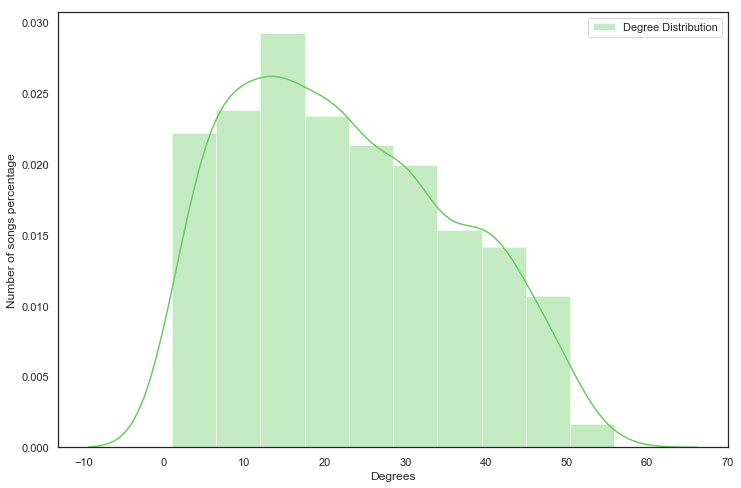

In [267]:
plot_distribution(dict(nx.degree(giant_of("hip-hop"))).values())

### Top 5 Songs most connected songs of Hip-Hop Network

The top-5 of Hip-Hop are really close regarding the musical attributes we have extracted from Spotify. Also, contrary to Rock, Hip-Hop seems as a more consistent sounding genre, as all top-5 songs have the same "new-school" sound of hip-hop music. This is a quality we can detect only by listening to the songs and cannot be inferred from the audio metric. As we said the audio metric can give us the general "mood" of a song and if this is combined with a fairly consostent sounding genre, then we have much better results.

- **Valence** audio metric ranges from 0.34 - 0.41
- **Energy** audio metric ranges from 0.5 - 0.59
- **Danceability** metric ranges from 0.76 - 0.82

By the above we can see that Hip-Hop's main mood and sound has relatively low "happyness", moderate, but high danceability.

In [158]:
printTopMembers(giant_of("hip-hop"))

The Top 5 most connected songs are:

Yoppa (with BlocBoy JB) by BlocBoy JB	 Degree: 56	 Audio Metric: [0.34, 0.5, 0.81]


Moves by Big Sean	 Degree: 54	 Audio Metric: [0.37, 0.53, 0.79]


Love Galore (feat. Travis Scott) by SZA	 Degree: 54	 Audio Metric: [0.41, 0.59, 0.8]


Sold Out Dates (feat. Lil Baby) by Gunna	 Degree: 53	 Audio Metric: [0.32, 0.55, 0.82]


FlatBed Freestyle by Playboi Carti	 Degree: 53	 Audio Metric: [0.4, 0.55, 0.76]




### Visualization of Communities Network of Hip-Hop

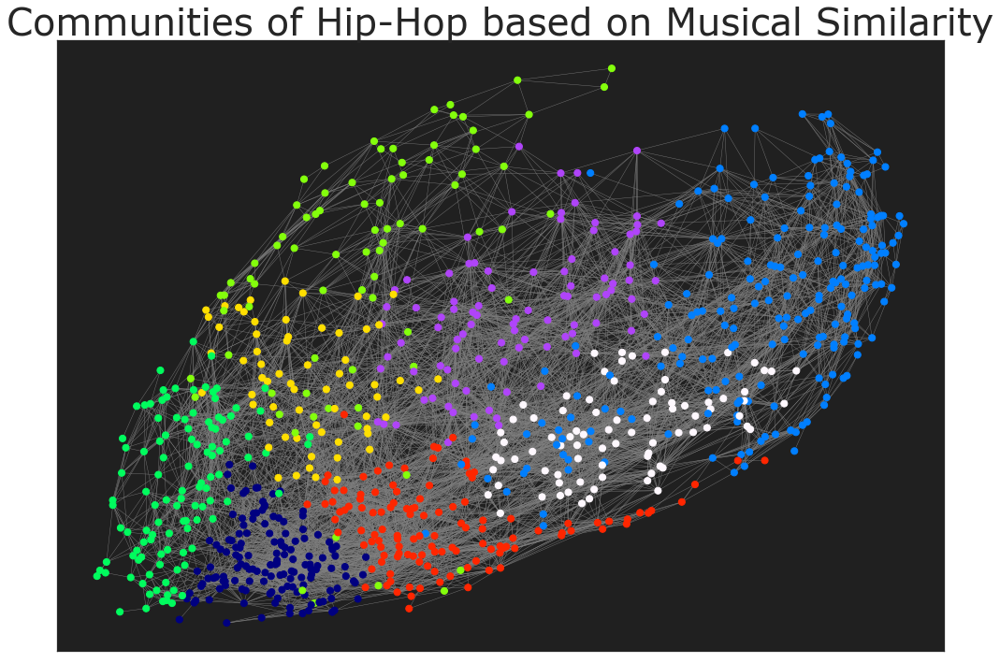

In [251]:
partition = computeCommunities(giant_of("hip-hop"))
drawNetworkCommunities(giant_of("hip-hop"), positions2, partition, 'Communities of Hip-Hop based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Rock from saddest/non-danceable to the happiest/most danceable/energetic.

In [106]:
partitions_data(giant_of("hip-hop"))

There are 8 main communities in the network.
Each one contains the following amount of songs: 

142
209
110
80
64
121
94
81

The mean Audio_Metric for each community is: 
[[0.25, 0.47, 0.81], [0.74, 0.67, 0.68], [0.2, 0.46, 0.65], [0.41, 0.66, 0.53], [0.22, 0.74, 0.73], [0.6, 0.53, 0.79], [0.49, 0.78, 0.72], [0.62, 0.67, 0.85]]


# Blues Network

### Visualization of Blues Network

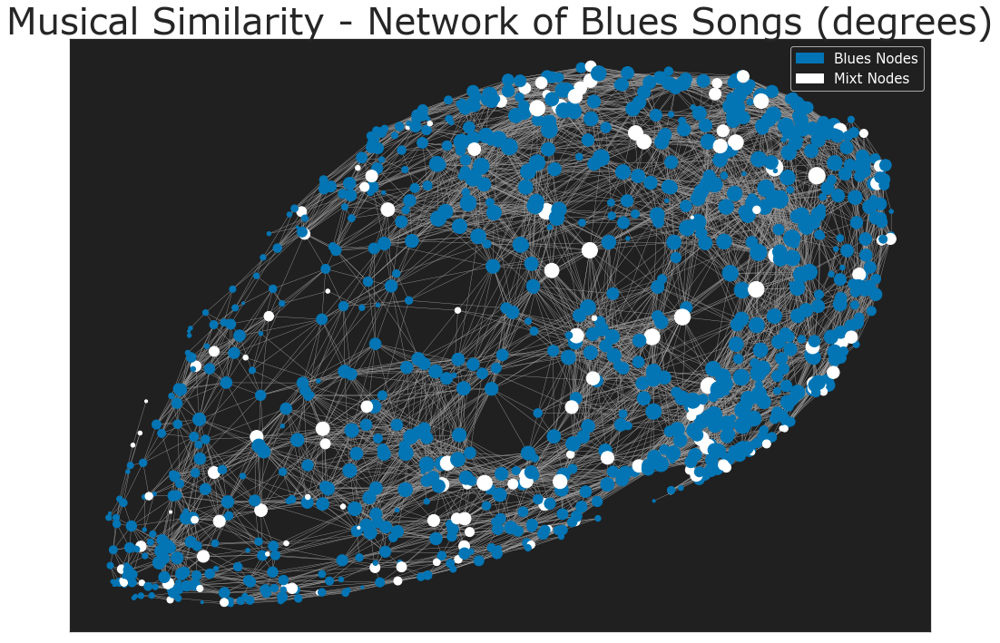

In [252]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("blues"), positions2, 'Musical Similarity - Network of Blues Songs (degrees)')

### Degree Distribution of the subgraph of Blues Songs

Here it is clear that we moved from the previous pattern, closer to the normal gaussian distribution. This means that most of the songs have the same amount of degree  and thus the song "mood" that we calculate is more consistent in this genre.

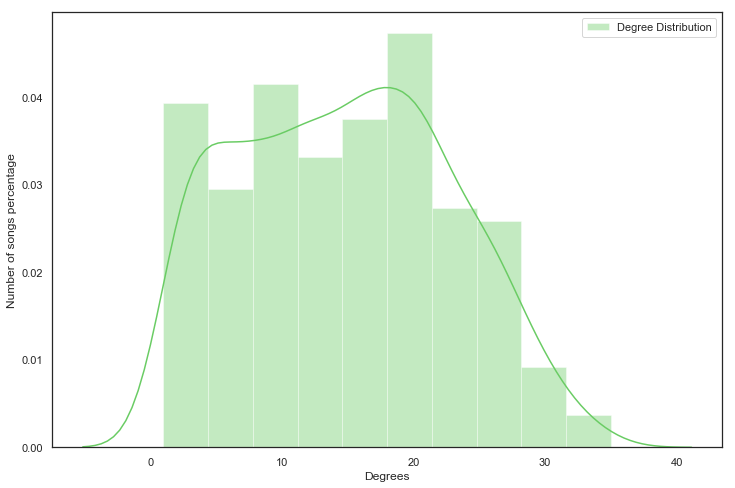

In [266]:
plot_distribution(dict(nx.degree(giant_of("blues"))).values())

### Top 5 Songs most connected songs of Blues Network

Through the degree distribution we have seen that the songs' "mood" obtained by our audio metric, is more consistent in this genre. However, again we come across to the phenomenon that occured in Rock music. Meaning that by listening to the top-5 songs there are differences between them regarding the actual sound. Some of them seem more like classic rock, which is highly influenced by blues, and others have a more contemporary sound, reminding bands like The Black Keys. We discussed in the respective blues cell and in the cinclusions how this can be overcome.

- **Valence** audio metric ranges from 0.75 - 0.77
- **Energy** audio metric ranges from 0.69 - 0.76
- **Danceability** metric ranges from 0.52 - 0.56

By the above we can see that Blue's main mood and sound has high "happyness", high energy, but an average danceability.

In [171]:
printTopMembers(giant_of("blues"))

The Top 5 most connected songs are:

American Woman - 7" Version by The Guess Who	 Degree: 35	 Audio Metric: [0.76, 0.74, 0.56]


Take It From Me by KONGOS	 Degree: 35	 Audio Metric: [0.76, 0.74, 0.56]


Reelin' In The Years by Steely Dan	 Degree: 34	 Audio Metric: [0.77, 0.76, 0.52]


Whiskey In The Jar by Metallica	 Degree: 33	 Audio Metric: [0.75, 0.69, 0.56]


Outta My Mind by The Arcs	 Degree: 33	 Audio Metric: [0.76, 0.74, 0.52]




### Visualization of Communities Network of Blues

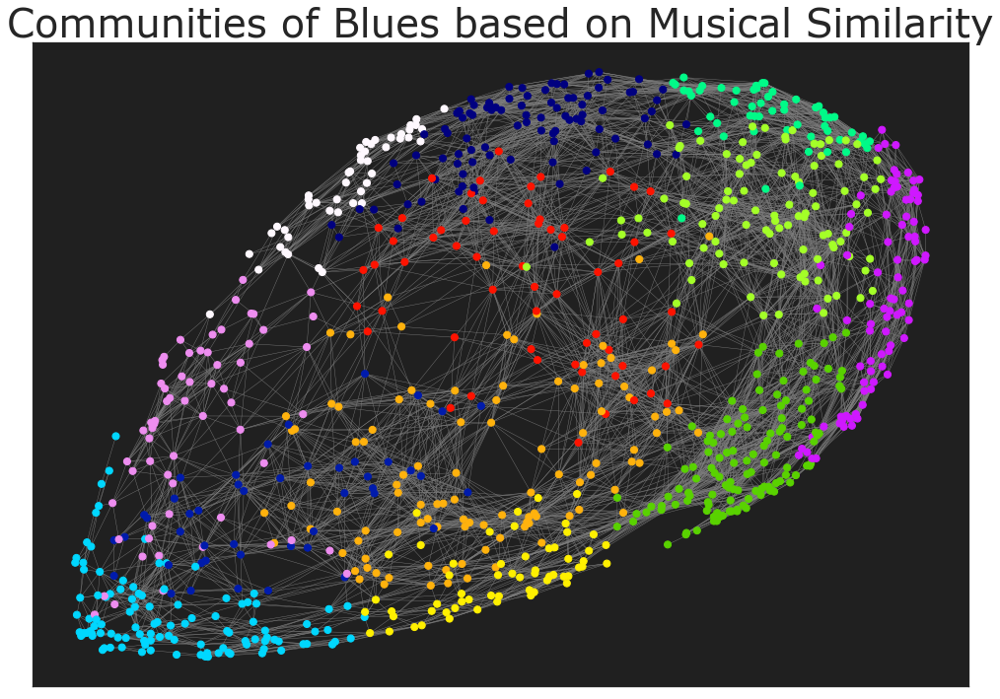

In [253]:
partition = computeCommunities(giant_of("blues"))
drawNetworkCommunities(giant_of("blues"), positions2, partition, 'Communities of Blues based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Rock from saddest/non-danceable to the happiest/most danceable/energetic.

In [112]:
partitions_data(giant_of("blues"))

There are 12 main communities in the network.
Each one contains the following amount of songs: 

94
46
109
56
127
100
58
109
61
88
63
47

The mean Audio_Metric for each community is: 
[[0.53, 0.84, 0.45], [0.3, 0.52, 0.58], [0.29, 0.34, 0.53], [0.77, 0.85, 0.51], [0.79, 0.47, 0.7], [0.76, 0.76, 0.56], [0.6, 0.4, 0.69], [0.63, 0.46, 0.41], [0.55, 0.67, 0.57], [0.93, 0.72, 0.63], [0.31, 0.51, 0.43], [0.33, 0.84, 0.38]]


# Indie Network

### Visualization of Indie Network

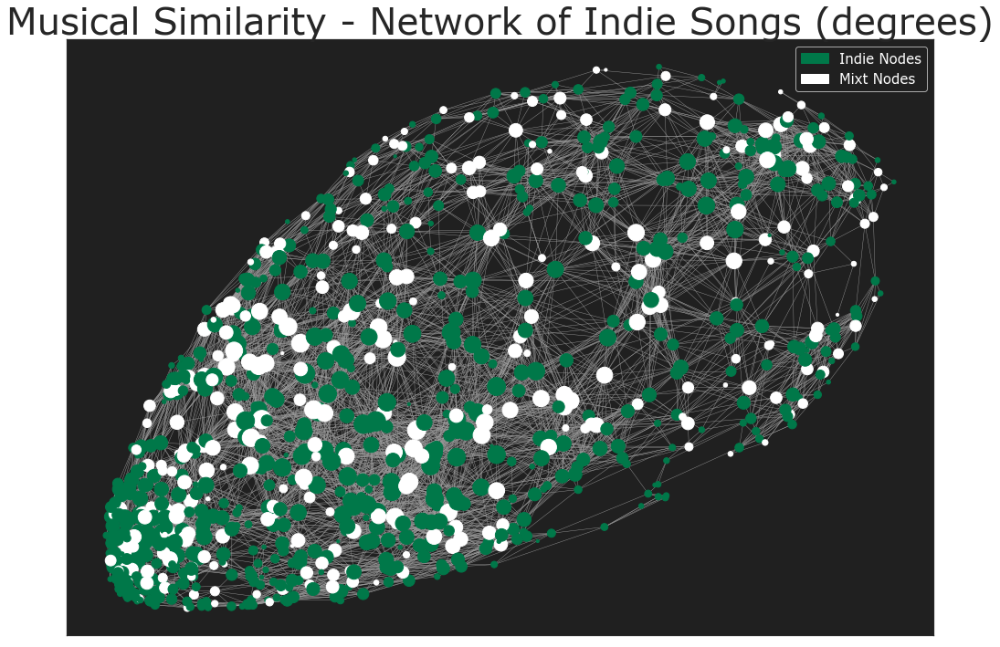

In [254]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("indie"), positions2, 'Musical Similarity - Network of Indie Songs (degrees)')

### Degree Distribution of the subgraph of Indie Songs

The degree distribution again moves back from the normal distribution, having most of the songs concentrated on degrees, lower than the mean one, in the same respect as Pop and Rock.

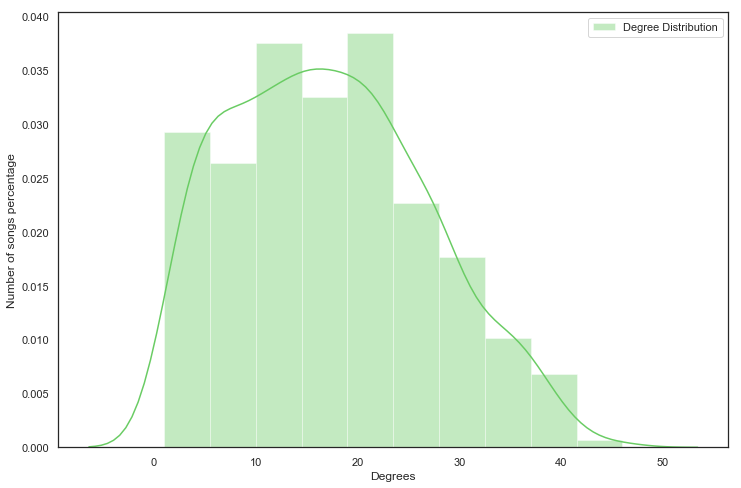

In [265]:
plot_distribution(dict(nx.degree(giant_of("indie"))).values())

### Top 5 Songs most connected songs of Indie Network

Indie also seems like a more consistent genre in terms of sound of the songs. We, ve seen by the degree distribution that few songs have high degree, thus these songs show the main moodof the genre, and we have also listened to the top 5, which seem very close sounding.

- **Valence** audio metric ranges from 0.34 - 0.45
- **Energy** audio metric ranges from 0.61 - 0.65
- **Danceability** metric ranges from 0.64 - 0.73

By the above we can see that Indie's main mood and sound has relativiley low "happyness", moderate energy, and makes you move a bit more than just standing still while listening.

In [180]:
printTopMembers(giant_of("indie"))

The Top 5 most connected songs are:

Flight 22 by Kali Uchis	 Degree: 46	 Audio Metric: [0.34, 0.65, 0.64]


Maybe We're Meant To Be Alone by Bad Suns	 Degree: 45	 Audio Metric: [0.4, 0.62, 0.69]


The Reason by Chelsea Cutler	 Degree: 42	 Audio Metric: [0.36, 0.61, 0.65]


Navajo by Masego	 Degree: 41	 Audio Metric: [0.36, 0.59, 0.69]


Crew (feat. Brent Faiyaz & Shy Glizzy) by GoldLink	 Degree: 41	 Audio Metric: [0.45, 0.61, 0.73]




### Visualization of Communities Network of Indie

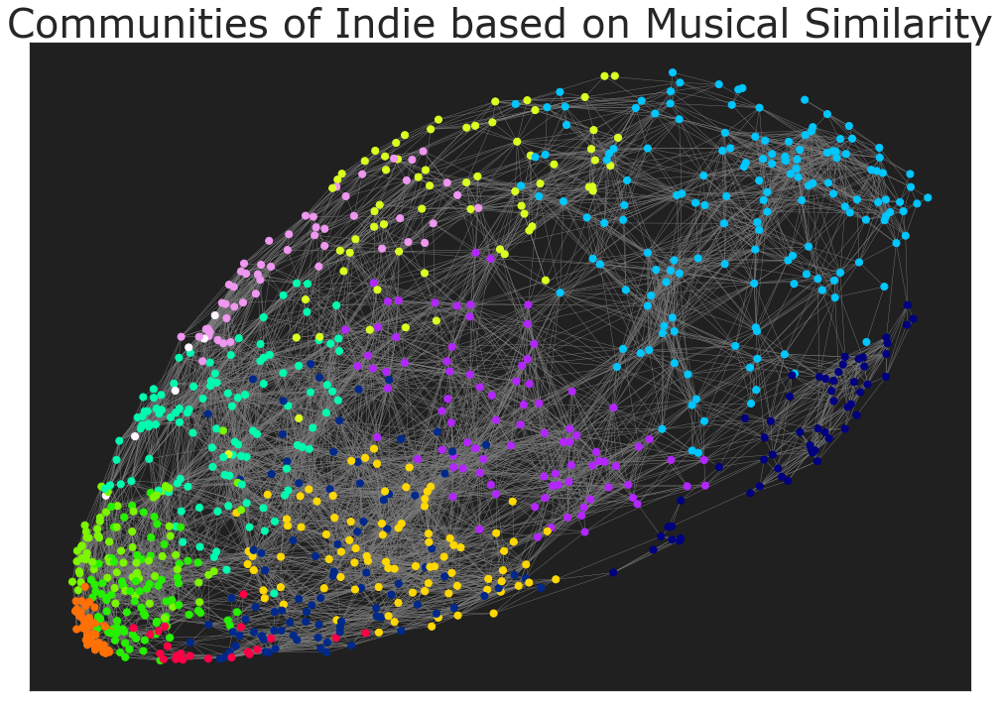

In [255]:
partition = computeCommunities(giant_of("indie"))
drawNetworkCommunities(giant_of("indie"), positions2, partition, 'Communities of Indie based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Rock from saddest/non-danceable to the happiest/most danceable/energetic.

In [118]:
partitions_data(giant_of("indie"))

There are 13 main communities in the network.
Each one contains the following amount of songs: 

56
94
157
111
85
69
67
88
46
22
90
51
6

The mean Audio_Metric for each community is: 
[[0.82, 0.55, 0.77], [0.47, 0.43, 0.65], [0.72, 0.8, 0.64], [0.21, 0.64, 0.6], [0.18, 0.38, 0.66], [0.22, 0.46, 0.45], [0.46, 0.75, 0.42], [0.39, 0.51, 0.79], [0.14, 0.21, 0.42], [0.42, 0.23, 0.5], [0.53, 0.63, 0.64], [0.32, 0.81, 0.55], [0.18, 0.63, 0.26]]


# Country Network

### Visualization of Indie Network

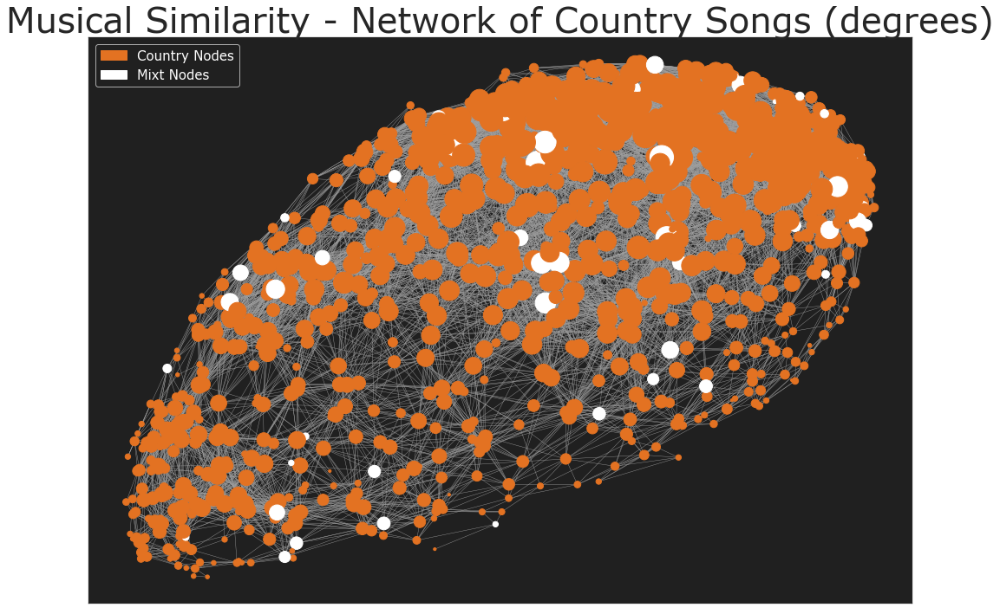

In [256]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("country"), positions2, 'Musical Similarity - Network of Country Songs (degrees)')

### Degree Distribution of the subgraph of Country Songs

The degree distribution follows the pattern of most genres. Few songs give the general "mood" og the genre's songs.

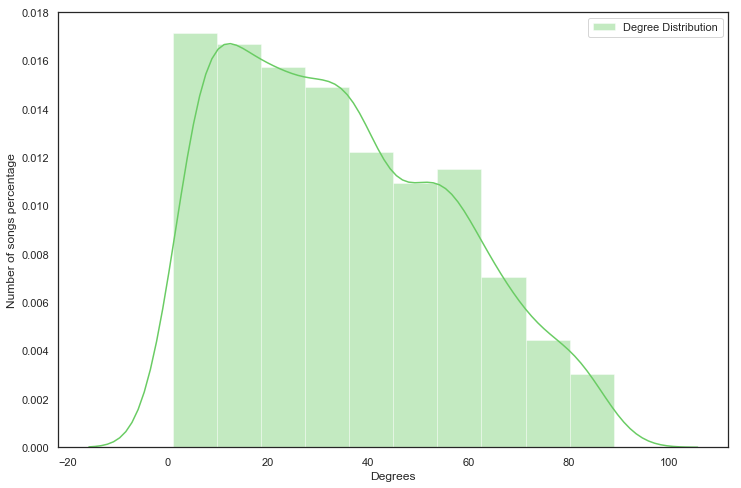

In [269]:
plot_distribution(dict(nx.degree(giant_of("country"))).values())

### Top 5 Songs most connected songs of Country Network

Country music is a genre that follows more strongly the pattern we are talking about. Only a few songs gibe the general "mood", although by listening to the songs we can see that they are the more traditional straight country songs onw would expect and then we have the more modern, which are like pop-country music.

- **Valence** audio metric ranges from 0.52 - 0.67
- **Energy** audio metric ranges from 0.8 - 0.85
- **Danceability** metric ranges from 0.55 - 0.59

By the above we can see that Country's main mood and sound has relativiley high "happyness", very high energy, but they average danceability, and trully country songs are not the ones that someone would expect to dance listening to them.

In [122]:
printTopMembers(giant_of("country"))

The Top 5 most connected songs are:

20 in a Chevy by Cole Swindell	 Degree: 89	 Audio Metric: [0.6, 0.82, 0.59]


Little Bit of Both by Chris Janson	 Degree: 88	 Audio Metric: [0.65, 0.85, 0.56]


That's When I Love You by Phil Vassar	 Degree: 87	 Audio Metric: [0.6, 0.83, 0.55]


Me on You by Morgan Evans	 Degree: 87	 Audio Metric: [0.52, 0.8, 0.57]


Me and My Kind by Cody Johnson	 Degree: 86	 Audio Metric: [0.67, 0.81, 0.59]




### Visualization of Communities Network of Country

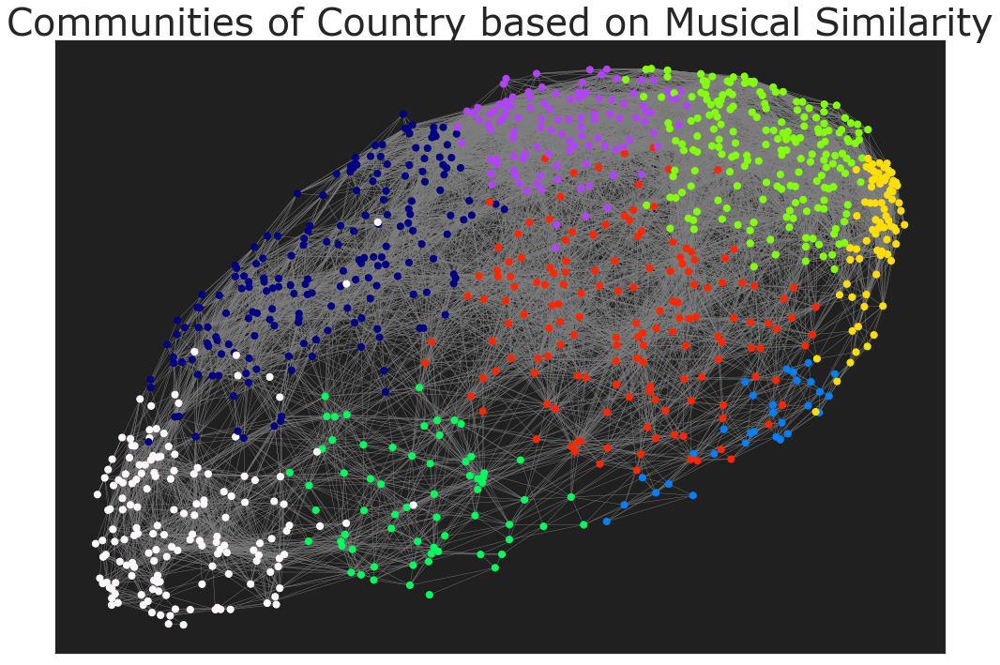

In [257]:
partition = computeCommunities(giant_of("country"))
drawNetworkCommunities(giant_of("country"), positions2, partition, 'Communities of Country based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Country from saddest/non-danceable to the happiest/most danceable/energetic.

In [124]:
partitions_data(giant_of("country"))

There are 8 main communities in the network.
Each one contains the following amount of songs: 

186
30
65
191
76
153
110
157

The mean Audio_Metric for each community is: 
[[0.33, 0.73, 0.53], [0.81, 0.49, 0.64], [0.48, 0.45, 0.68], [0.77, 0.83, 0.57], [0.88, 0.76, 0.71], [0.63, 0.66, 0.6], [0.55, 0.85, 0.55], [0.35, 0.42, 0.51]]


# Soul Network

### Visualization of Soul Network

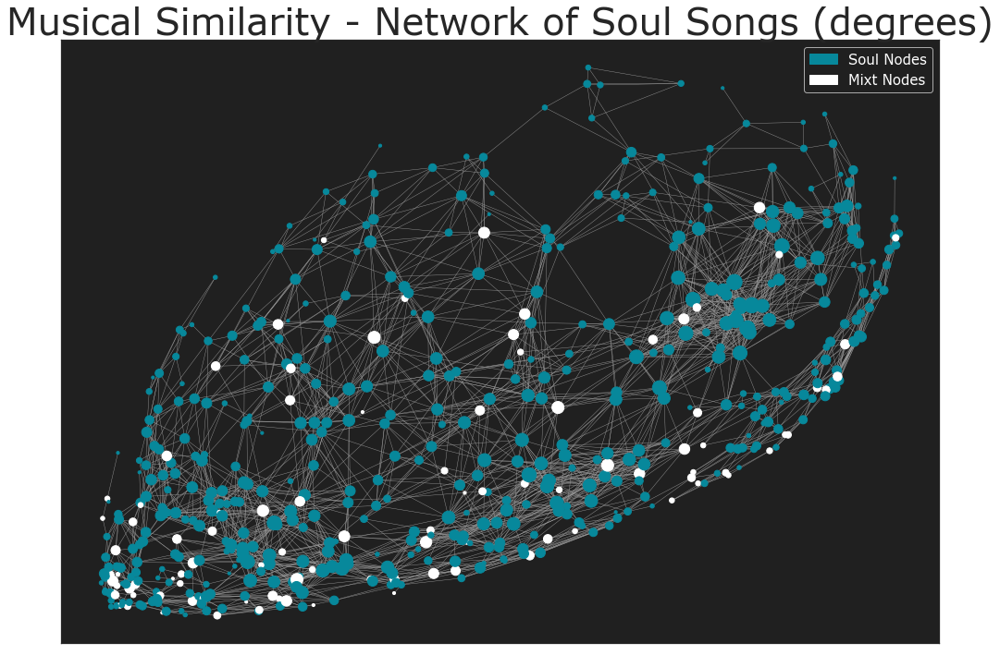

In [258]:
drawNetworkofSongs("degrees", "solo_graph", giant_of("soul"), positions2, 'Musical Similarity - Network of Soul Songs (degrees)')

### Degree Distribution of the subgraph of Soul Songs

The degree distribution follows the pattern of most genres. Fewer songs give the general "mood" of the genre's songs.

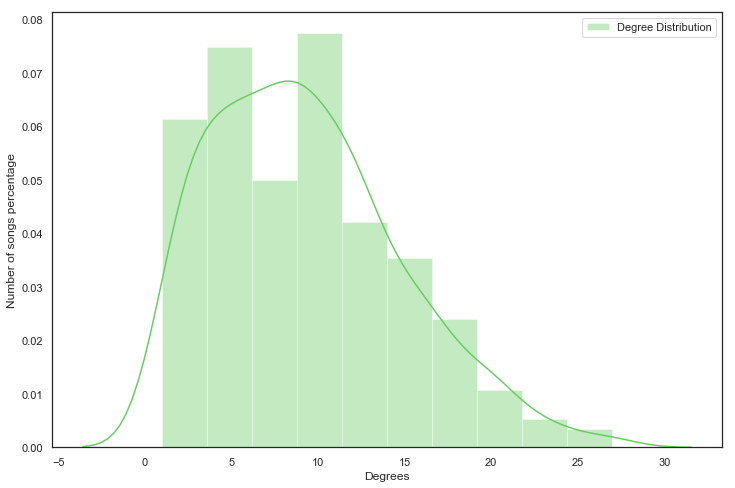

In [270]:
plot_distribution(dict(nx.degree(giant_of("soul"))).values())

### Top 5 Songs most connected songs of Soul Network

Soul follows the pattern we are talking about. Only a few songs give the general "mood". By listening to the songs, we see that only one has a more traditional soul mood, while the others are modern and sometimes do not remind you of soul, althouth the respective artist is classified as soul by Spotify.

- **Valence** audio metric ranges from 0.69 - 0.72
- **Energy** audio metric ranges from 0.66 - 0.75
- **Danceability** metric ranges from 0.65 - 0.68

By the above we can see that Soul's main mood and sound has mild to high "happyness", mild energy and mild danceability.

In [202]:
printTopMembers(giant_of("soul"))

The Top 5 most connected songs are:

Fantasy by Alina Baraz	 Degree: 27	 Audio Metric: [0.69, 0.71, 0.67]


I Can't Get Next To You by The Temptations	 Degree: 27	 Audio Metric: [0.71, 0.69, 0.68]


Charlie Brown by Anna Of The North	 Degree: 27	 Audio Metric: [0.71, 0.67, 0.67]


Safe - Shallou Remix by Shallou	 Degree: 25	 Audio Metric: [0.71, 0.66, 0.65]


Come Over by Kenny Chesney	 Degree: 25	 Audio Metric: [0.72, 0.75, 0.68]




### Visualization of Communities Network of Soul

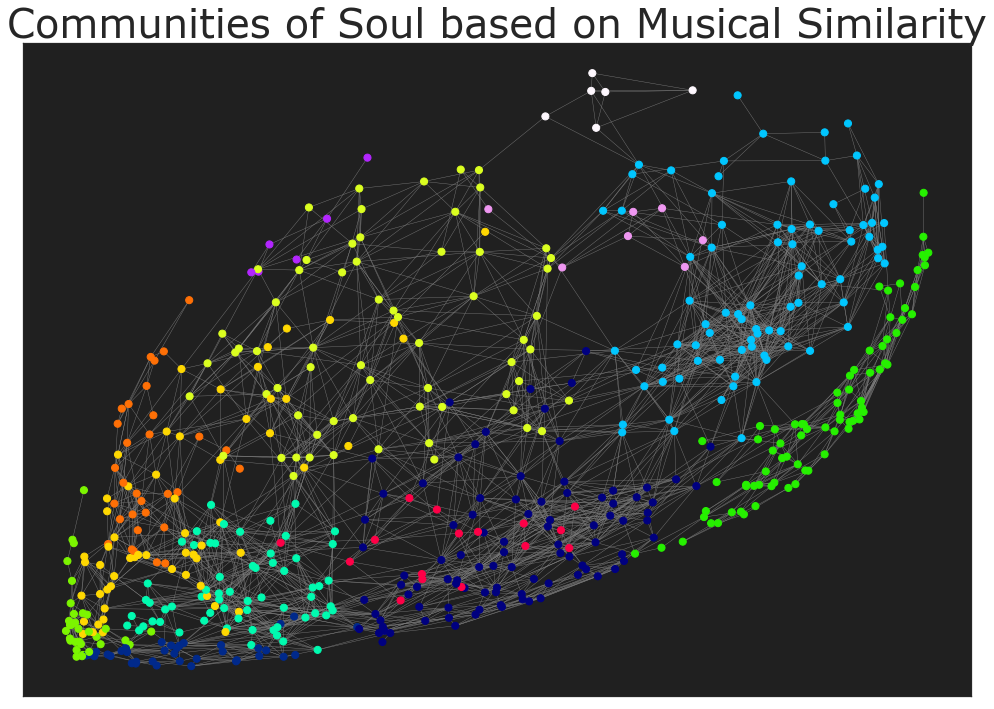

In [259]:
partition = computeCommunities(giant_of("soul"))
drawNetworkCommunities(giant_of("soul"), positions2, partition, 'Communities of Soul based on Musical Similarity')

Below we use the ***partition_data*** function, (another function you can review under the Partitions Functions segment).

We print the:
- number of different partitions that exist in the graph
- the number of songs per partition
- the mean audio metric for every partition.

These different partitions indicate different "sounds" or types, or subgenres of Soul from saddest/non-danceable to the happiest/most danceable/energetic.

In [130]:
partitions_data(giant_of("soul"))

There are 13 main communities in the network.
Each one contains the following amount of songs: 

94
37
83
62
78
33
64
59
31
16
6
7
6

The mean Audio_Metric for each community is: 
[[0.59, 0.43, 0.71], [0.29, 0.24, 0.59], [0.73, 0.77, 0.64], [0.24, 0.45, 0.75], [0.82, 0.59, 0.7], [0.19, 0.3, 0.39], [0.4, 0.72, 0.65], [0.29, 0.47, 0.47], [0.14, 0.64, 0.61], [0.57, 0.4, 0.49], [0.26, 0.91, 0.61], [0.54, 0.88, 0.76], [0.59, 0.87, 0.54]]


# Analysis Step 3 - Full Network

### Visualization of Soul Network

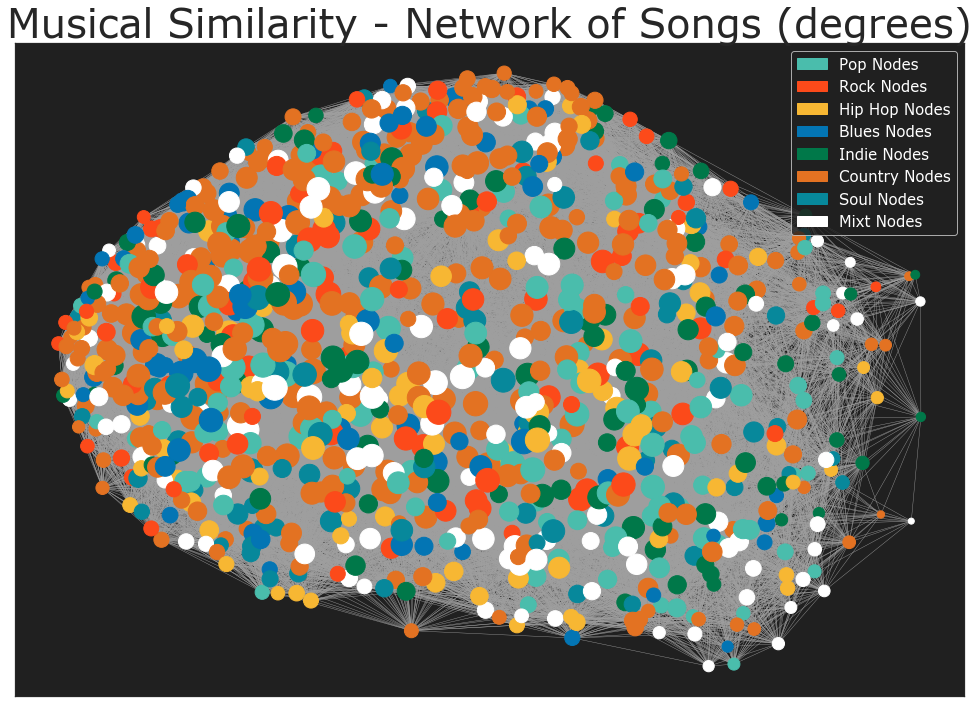

In [264]:
#Visualize the network with nodes' size proportional to their degree
drawNetworkofSongs("degrees", 'full_graph', sub_H, positions, 'Musical Similarity - Network of Songs (degrees)')

### Degree Distribution of the subgraph of Full Songs

The degree distribution follows the Gaussian distribution. We can say that this is expected sice this is the full graph of all songs, which gives more randomness to the data points.

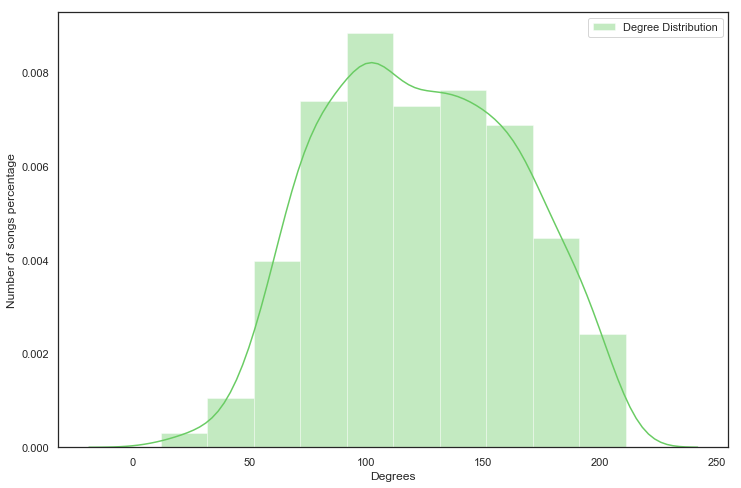

In [271]:
plot_distribution(dict(nx.degree(sub_H)).values())

## Number of mixed songs per genre

By mixed songs we mean songs that belong to more than one genre at the same time. This can give us a sense of how consistent, or "strict" a genre can be in terms of musical style. In the next cell you can see the code for obtaining the plot and, below is the plot itself.

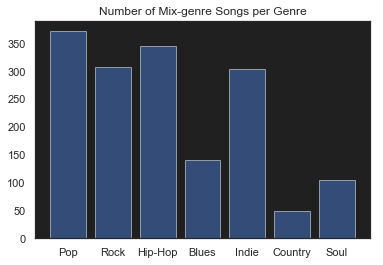

In [73]:
pop_cnt = 0
rock_cnt = 0
hiphop_cnt = 0
blues_cnt = 0
indie_cnt = 0
country_cnt = 0
soul_cnt = 0
for node in H.nodes:
    if "pop" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        pop_cnt += 1
    if "rock" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        rock_cnt += 1
    if "hip-hop" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        hiphop_cnt += 1
    if "blues" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        blues_cnt += 1
    if "indie" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        indie_cnt += 1
    if "country" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        country_cnt += 1
    if "soul" in H.nodes[node]['Genre'] and len(H.nodes[node]['Genre'])>1:
        soul_cnt += 1

mixt_list = [pop_cnt, rock_cnt, hiphop_cnt, blues_cnt, indie_cnt, country_cnt, soul_cnt]


objects = ('Pop', 'Rock', 'Hip-Hop', 'Blues', 'Indie', 'Country', 'Soul')
y_pos = np.arange(len(objects))
performance = mixt_list
 
plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.title('Number of Mix-genre Songs per Genre')
 
plt.show()

From the above plot we get a well expected result. The more popular genres (pop, hip-hop, rock) have more mixed songs. This makes sense, if we consider that the genres stem from artists and not from the songs, and thus artists from more popular genres have a more diverse and broad range.

Soul, blues and country on the other side hav much more mixed songs, which shows that the respective artists have a more focused attitude to their genre's music style.

# Discussion - Conclusions 

We have seen that our metric works well in detecting a general "mood" of a song, but it cannot quite catch the real sound of a song. We can give an example, which was drawn by  analyzing the Rock Network. While commenting on the top 5 connected songs of the Network, we' ve seen that although the songs were very close values of the audio_metric, some of them were very different on how they sound.

The first one was ***Metallica's - Master of Puppets*** and the second one was ***WALK THE MOON's - Shut Up and Dance***

It is obvious that there is a difference in sound between them.

The problem lies in the fact that Spotify is not very "strict" in regards to genre separation. This means that genres like Rock can contain many songs that also belong to another genre, consequently making a more diverse genre.

The way we could overcome this problem is threefold. Firstly, be more strict when downloading the artists, in the sense of writing more specific queries and thus obtaining only the really relevant artists and consequently songs of each genre.
Secondly, as we cannot avoid the fact that artists with mixed genres will occur, when obtaining the top-5 songs of each genre, we could filter the songs and keep only the ones that belong **only** to that particular genre. Lastly, the most ambitious goal of ours, would be to connect our audio metric, with the lyrics sentiment metric and build a much more reliable metric that takes into account both "mood" and context.



Regarding communities Also,we have seen that, in general we had 12-14 per genre. If we assume that every community can represent a subgenre, 12-14 might be a big number. This can be lowered by increasing the treshold for connecting two songs. This way less and more broad communities will be produced, with more distinct audio metrics between them.
In addition, future work that should be done is to find and categorize each subgenre(community) by further analyzing the community neteworks. 